In [3]:
# Stop warnings
import warnings
warnings.filterwarnings("ignore")

# General imports
import sys, os
import numpy as np
import glob
import datetime
import json
import importlib
import ipdb
deb = ipdb.set_trace

# MRI analysis imports
import nibabel as nb
import cortex
sys.path.append("{}/../../../../utils".format(os.getcwd()))
from cf_utils import *
from pycortex_utils import set_pycortex_config_file

# Get inputs
start_time = datetime.datetime.now()
main_dir = '/Users/martinszinte/disks/meso_S/data'
project_dir = 'gaze_exp'
subject = 'sub-002'
gaze_direction = 'center'

In [6]:
# Analysis parameters
with open('../../../../settings.json') as f:
    json_s = f.read()
    analysis_info = json.loads(json_s)
TR = analysis_info['TR']
grid_cf_nr = analysis_info['grid_cf_nr']
max_cf_size = analysis_info['max_cf_size']
xfm_name = analysis_info['xfm_name']
high_pass_type = analysis_info['high_pass_type']

# Define directories
cortex_dir = "{}/{}/derivatives/pp_data/cortex".format(main_dir, project_dir)
avg_dir = "{}/{}/derivatives/pp_data/{}/func/fmriprep_{}_avg".format(main_dir, project_dir, subject, high_pass_type)
prf_fit_dir = "{}/{}/derivatives/pp_data/{}/prf/fit".format(main_dir, project_dir, subject)
cf_fit_dir = "{}/{}/derivatives/pp_data/{}/cf/fit".format(main_dir, project_dir, subject)
os.makedirs(cf_fit_dir, exist_ok=True)

# Set pycortex db and colormaps
set_pycortex_config_file(cortex_dir)
importlib.reload(cortex)

# Define data filenames
gaze_cw_fn = "/Users/martinszinte/Downloads/{}_task-GazeCW_fmriprep_{}_bold_avg.nii.gz".format(subject, high_pass_type)
gaze_ccw_fn = "/Users/martinszinte/Downloads/{}_task-GazeCCW_fmriprep_{}_bold_avg.nii.gz".format(subject, high_pass_type)
deriv_avg_loo_fn = "{}/{}_task-prf_fmriprep_{}_bold_loo_avg_prf-deriv.nii.gz".format(prf_fit_dir, subject, high_pass_type)
deriv_cf_fn = "{}/{}_task-GazeCWCCW-{}_fmriprep_{}_bold_loo_avg_CFprf-deriv.nii.gz".format(cf_fit_dir, subject, gaze_direction, high_pass_type)

# Load data in volumes
gaze_cw_vol = nb.load(gaze_cw_fn)
gaze_ccw_vol = nb.load(gaze_ccw_fn)

In [7]:
# Convert volumes to surfaces
# Average data of CW and CCW for each gaze directions
run_trs = [[3, 70], [71, 138], [139, 206], [207, 274], [275, 342]]
cw_center_tr, ccw_center_tr = run_trs[0], run_trs[4]
cw_left_tr, ccw_left_tr = run_trs[1], run_trs[3]
cw_up_tr, ccw_up_tr = run_trs[2], run_trs[2]
cw_right_tr, ccw_right_tr = run_trs[3], run_trs[1]
cw_down_tr, ccw_down_tr = run_trs[4], run_trs[0]

#mapper = cortex.get_mapper(subject, xfm_name, 'line_nearest', recache=True)
mapper = cortex.get_mapper(subject, xfm_name, 'trilinear', recache=True)

print("load {}".format(gaze_cw_fn))
gaze_cw_surf = mapper(cortex.Volume(gaze_cw_vol.get_fdata().T, subject, xfm_name)).data
exec("gaze_{gaze_dir}_cw_surf = gaze_cw_surf[cw_{gaze_dir}_tr[0]:cw_{gaze_dir}_tr[1]]".format(gaze_dir = gaze_direction))
exec("del gaze_cw_surf")
print("end loading 1")

print("load {}".format(gaze_ccw_fn))
gaze_ccw_surf = mapper(cortex.Volume(gaze_ccw_vol.get_fdata().T, subject, xfm_name)).data
exec("gaze_{gaze_dir}_ccw_surf = gaze_ccw_surf[ccw_{gaze_dir}_tr[0]:ccw_{gaze_dir}_tr[1]]".format(gaze_dir = gaze_direction))
exec("del gaze_ccw_surf")
print("end loading 2")

exec("train_data = np.nanmean((gaze_{gaze_dir}_cw_surf, gaze_{gaze_dir}_ccw_surf),axis=0)".format(gaze_dir = gaze_direction))
exec("del gaze_{gaze_dir}_cw_surf".format(gaze_dir = gaze_direction))
exec("del gaze_{gaze_dir}_ccw_surf".format(gaze_dir = gaze_direction))
print("end averaging")

Caching mapper...
load /Users/martinszinte/Downloads/sub-002_task-GazeCW_fmriprep_dct_bold_avg.nii.gz
end loading 1
load /Users/martinszinte/Downloads/sub-002_task-GazeCCW_fmriprep_dct_bold_avg.nii.gz
end loading 2
end averaging


In [8]:
# Define source region for CF models
surfs = [cortex.polyutils.Surface(*d) for d in cortex.db.get_surf(subject, "flat")]
surf_lh, surf_rh = surfs[0], surfs[1]
lh_vert_num, rh_vert_num = surf_lh.pts.shape[0], surf_rh.pts.shape[0]
vert_num = lh_vert_num + rh_vert_num
source_roi = 'V1'
roi_verts = cortex.get_roi_verts(subject, mask=True)
maskL = roi_verts[source_roi][:lh_vert_num]
maskR = roi_verts[source_roi][lh_vert_num:]
myv1surf = subsurface(subject,[maskL,maskR])
myv1surf.create()

# Make a connective field 'stimulus'
train_stim = CFStimulus(data=train_data.T, 
                        vertinds=myv1surf.subsurface_verts, 
                        distances=myv1surf.distance_matrix)

# Define model
model = CFGaussianModel(train_stim)

# Define fitter and perform 'quick' grids using the CF sizes options
grid_cf_nr = 2
print("{} CF quick grid fit with CF size grid of {} elements".format(gaze_direction, grid_cf_nr))
gf = CFFitter(data=train_data.T, model=model)
exec("del train_data")
cf_sizes = max_cf_size*np.linspace(0.1,1,grid_cf_nr)**2
gf.quick_grid_fit(cf_sizes)

Generating subsurfaces
Creating distance by distance matrices
center CF quick grid fit with CF size grid of 2 elements


In [9]:
# Load pRF paramameters for projection
print("Load PRF data")
deriv_img = nb.load(deriv_avg_loo_fn)
deriv_mat = deriv_img.get_fdata()

# Convert pRF parameters in vertices
params_num = 10
rsq_idx, rsq_loo_idx, ecc_idx, polar_real_idx, polar_imag_idx , size_idx, \
    amp_idx, baseline_idx, x_idx, y_idx = 0,1,2,3,4,5,6,7,8,9
vert_prf = np.vstack((mapper(cortex.Volume(deriv_mat[...,rsq_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,rsq_loo_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,ecc_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,polar_real_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,polar_imag_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,size_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,amp_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,baseline_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,x_idx].T, subject, xfm_name)).data,
                      mapper(cortex.Volume(deriv_mat[...,y_idx].T, subject, xfm_name)).data))

Load PRF data


In [63]:
gf.quick_gridsearch_params[:,0]

array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 9.9300e+02, 1.9023e+04,
       4.1000e+02])

In [10]:
param_to_print = vert_rsq_data 
print('min: {:1.3f}'.format(np.nanmin(param_to_print)))
print('max: {:1.3f}'.format(np.nanmax(param_to_print)))

min: 0.000
max: 0.496


In [64]:
# CF projected parameters on surface
print("Get projected CF PRF data")
vert_cf = np.vstack((vert_prf[:,gf.quick_vertex_centres],
                     gf.quick_gridsearch_params[:,0], # Vertex number that best explain variance
                     gf.quick_gridsearch_params[:,1], # CF size
                     gf.quick_gridsearch_params[:,2]  # CF R2
                    ))

Get projected CF PRF data


In [67]:
vert_cf[0,:]

array([0.09115992, 0.0989572 , 0.11586425, ..., 0.10035251, 0.04723735,
       0.12426904])

In [37]:
# # how to save a gii
# import nibabel as nib
# img = nib.gifti.GiftiImage(darrays=[nib.gifti.GiftiDataArray(vert_cf)])
# nib.save(img, '/Users/martinszinte/Downloads/rsq.gii')
# # how to load a gii
# rsq_saved = nib.load('/Users/martinszinte/Downloads/rsq.gii').agg_data()

In [17]:
sys.path.append("{}/../../utils".format(os.getcwd()))
from pycortex_utils import draw_cortex, set_pycortex_config_file

# Define analysis parameters
with open('../../../../settings.json') as f:
    json_s = f.read()
    analysis_info = json.loads(json_s)

# Load params
deriv_fn = deriv_avg_loo_fn
deriv_img = nb.load(deriv_fn)
deriv_mat = deriv_img.get_fdata()

# Maps settings
params_num = 10
rsq_idx, rsq_loo_idx, ecc_idx, polar_real_idx, polar_imag_idx , size_idx, \
    amp_idx, baseline_idx, x_idx, y_idx = 0,1,2,3,4,5,6,7,8,9

cmap_polar, cmap_uni, cmap_ecc_size = 'hsv', 'Reds', 'Spectral'
col_offset = 1.0/14.0
cmap_steps = 255

# plot scales
rsq_scale = [0, 0.4]
ecc_scale = [0, 10]
size_scale = [0, 10]
alpha_range = [0, 0.2]

# load data
prf_deriv_mat = deriv_mat
cf_deriv_mat = deriv_cf_mat
    
# threshold data
prf_deriv_mat_th = prf_deriv_mat
rsqr_th_down = prf_deriv_mat_th[...,rsq_idx] >= analysis_info['rsqr_th'][0]
rsqr_th_up = prf_deriv_mat_th[...,rsq_idx] <= analysis_info['rsqr_th'][1]
prf_all_th = np.array((rsqr_th_down,rsqr_th_up)) 
prf_deriv_mat[np.logical_and.reduce(prf_all_th)==False,rsq_idx]=0

cf_deriv_mat_th = cf_deriv_mat
amp_down =  cf_deriv_mat_th[...,amp_idx] > 0
size_th_down = cf_deriv_mat_th[...,size_idx] >= analysis_info['size_th'][0]
size_th_up = cf_deriv_mat_th[...,size_idx] <= analysis_info['size_th'][1]
ecc_th_down = cf_deriv_mat_th[...,ecc_idx] >= analysis_info['ecc_th'][0]
ecc_th_up = cf_deriv_mat_th[...,ecc_idx] <= analysis_info['ecc_th'][1]
cf_all_th = np.array((amp_down,size_th_down,size_th_up,ecc_th_down,ecc_th_up)) 
cf_deriv_mat[np.logical_and.reduce(cf_all_th)==False,rsq_idx]=0


polar_255_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)
ecc_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)
size_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)


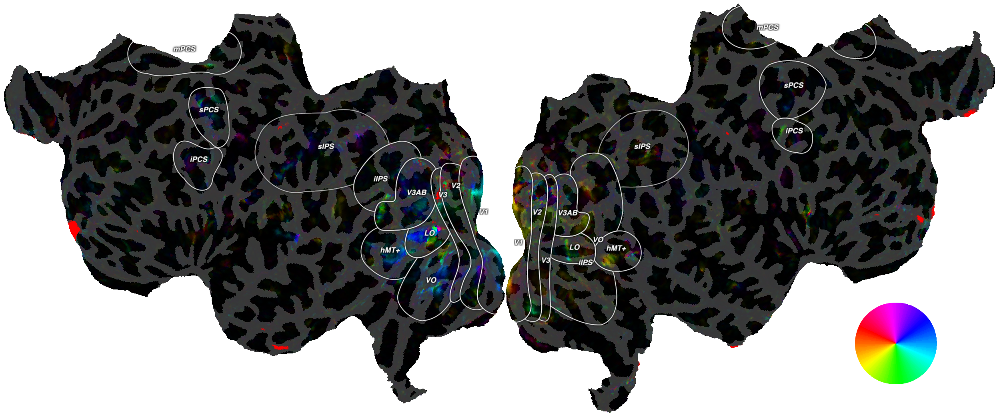

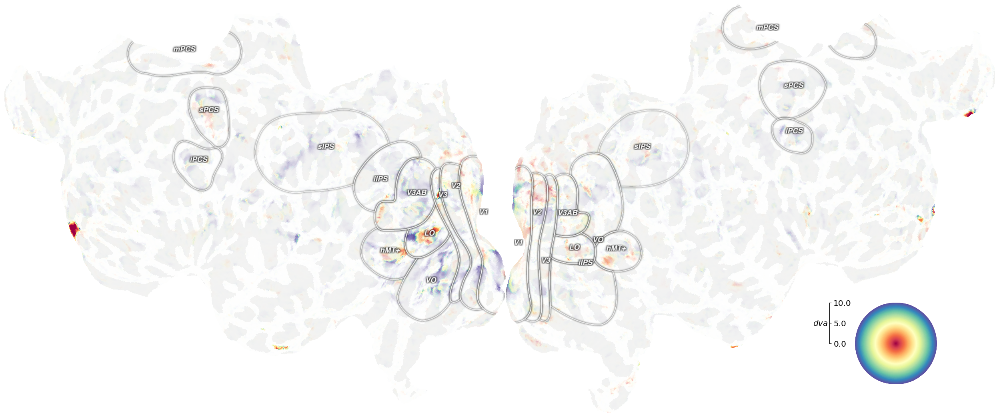

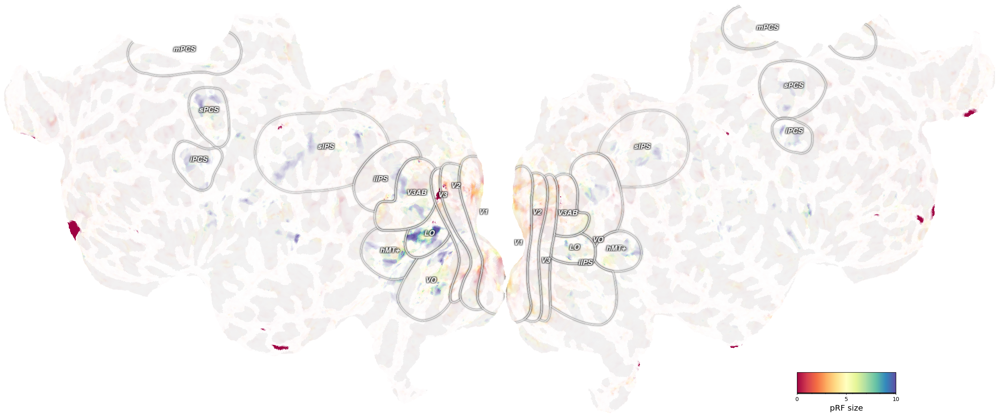

In [18]:
# Vertex analysis : pRF retinotopy
# ---------------

maps_names = []

# R2
rsq_data = vert_rsq_loo_data
alpha = (rsq_data - alpha_range[0])/(alpha_range[1]-alpha_range[0])
alpha[alpha>1]=1

# Polar angle
pol_comp_num = vert_polar_real_data + 1j * vert_polar_imag_data
polar_ang = np.angle(pol_comp_num)
ang_norm = (polar_ang + np.pi) / (np.pi * 2.0)
ang_norm = np.fmod(ang_norm + col_offset,1)
param_polar = {'data': ang_norm, 'cmap': cmap_polar, 'alpha': alpha, 
               'vmin': 0, 'vmax': 1, 'cmap_steps': cmap_steps, 'cortex_type': 'VertexRGB',
               'cbar': 'polar', 'col_offset': col_offset, 
               'description': 'PRF polar:{:3.0f} steps'.format(cmap_steps), 
               'curv_brightness': 0.1, 'curv_contrast': 0.25,
               'with_labels': True}
exec('param_polar_{cmap_steps}_vertex = param_polar'.format(cmap_steps = int(cmap_steps)))
exec('maps_names.append("polar_{cmap_steps}_vertex")'.format(cmap_steps = int(cmap_steps)))

# Eccentricity
ecc_data = vert_ecc_data
param_ecc_vertex = { 'data': ecc_data, 'cmap': cmap_ecc_size, 'alpha': alpha,
                     'vmin': ecc_scale[0], 'vmax': ecc_scale[1], 
                     'cbar': 'ecc', 'cortex_type': 'VertexRGB',
                     'description': 'PRF eccentricity'.format(), 'curv_brightness': 1,
                     'curv_contrast': 0.1, 'with_labels': True}
maps_names.append('ecc_vertex')

# Size
size_data = vert_size_data
param_size_vertex = {'data': size_data, 'cmap': cmap_ecc_size, 'alpha': alpha, 
              'vmin': size_scale[0], 'vmax': size_scale[1], 'cbar': 'discrete', 
              'cortex_type': 'VertexRGB', 'description': 'PRF size', 
              'curv_brightness': 1, 'curv_contrast': 0.1, 'cbar_label': 'pRF size',
              'with_labels': True}
maps_names.append('size_vertex')


for maps_name in maps_names:
    # create flatmap
    roi_name = '{}'.format(maps_name)
    roi_param = {'subject': subject, 'xfmname': xfm_name, 'roi_name': roi_name}
    print(roi_name)
    exec('param_{}.update(roi_param)'.format(maps_name))
    exec('volume_{maps_name} = draw_cortex(**param_{maps_name})'.format(maps_name = maps_name))

polar_255_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)
ecc_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)
size_vertex
Background RRGGBBAA: ffffff00
Area 0:0:2477.85:1024 exported to 2478 x 1024 pixels (96 dpi)


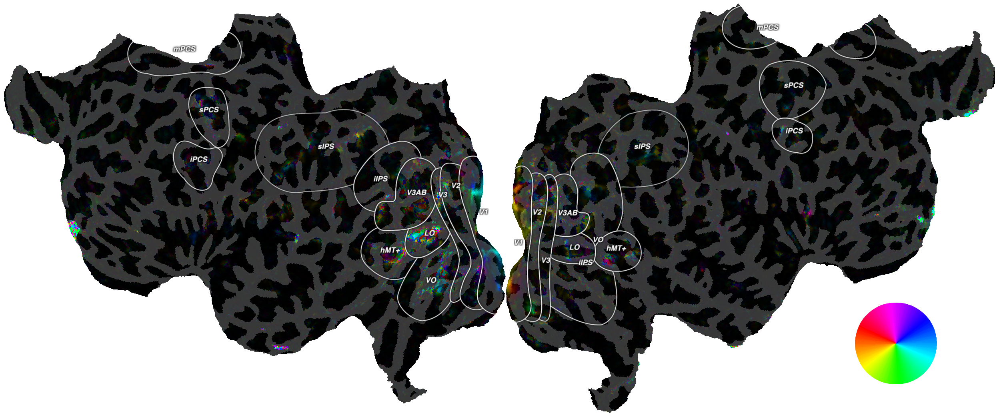

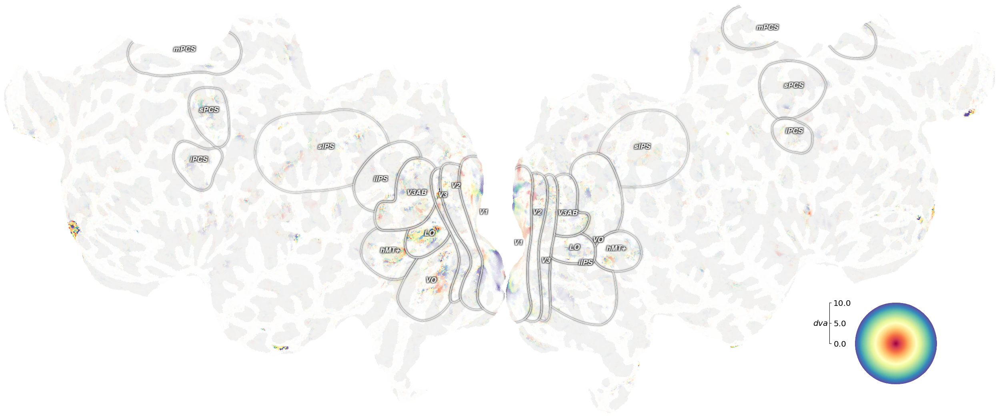

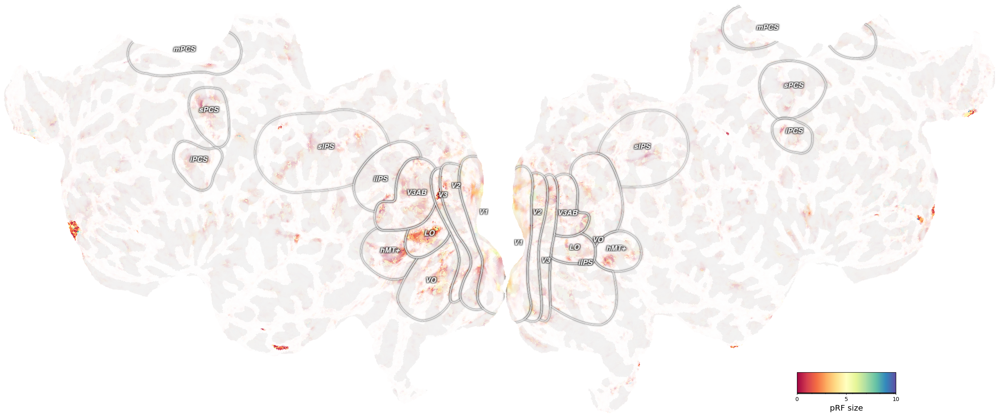

In [19]:
# Vertex analysis : CF projected retinotopy
# ---------------

maps_names = []

# R2
rsq_data = vert_rsq_loo_data
alpha = (rsq_data - alpha_range[0])/(alpha_range[1]-alpha_range[0])
alpha[alpha>1] = 1

# CF Polar angle
pol_comp_num = vert_cf_polar_real_data + 1j * vert_cf_polar_imag_data
polar_ang = np.angle(pol_comp_num)
ang_norm = (polar_ang + np.pi) / (np.pi * 2.0)
ang_norm = np.fmod(ang_norm + col_offset,1)
param_polar = {'data': ang_norm, 'cmap': cmap_polar, 'alpha': alpha, 
               'vmin': 0, 'vmax': 1, 'cmap_steps': cmap_steps, 'cortex_type': 'VertexRGB',
               'cbar': 'polar', 'col_offset': col_offset, 
               'description': 'PRF polar:{:3.0f} steps'.format(cmap_steps), 
               'curv_brightness': 0.1, 'curv_contrast': 0.25,
               'with_labels': True}
exec('param_polar_{cmap_steps}_vertex = param_polar'.format(cmap_steps = int(cmap_steps)))
exec('maps_names.append("polar_{cmap_steps}_vertex")'.format(cmap_steps = int(cmap_steps)))

# Eccentricity
ecc_data = vert_cf_ecc_data
param_ecc_vertex = { 'data': ecc_data, 'cmap': cmap_ecc_size, 'alpha': alpha,
                     'vmin': ecc_scale[0], 'vmax': ecc_scale[1], 
                     'cbar': 'ecc', 'cortex_type': 'VertexRGB',
                     'description': 'PRF eccentricity'.format(), 'curv_brightness': 1,
                     'curv_contrast': 0.1, 'with_labels': True}
maps_names.append('ecc_vertex')

# Size
size_data = vert_cf_size_data
param_size_vertex = {'data': size_data, 'cmap': cmap_ecc_size, 'alpha': alpha, 
              'vmin': size_scale[0], 'vmax': size_scale[1], 'cbar': 'discrete', 
              'cortex_type': 'VertexRGB', 'description': 'PRF size', 
              'curv_brightness': 1, 'curv_contrast': 0.1, 'cbar_label': 'pRF size',
              'with_labels': True}
maps_names.append('size_vertex')

for maps_name in maps_names:
    # create flatmap
    roi_name = '{}'.format(maps_name)
    roi_param = {'subject': subject, 'xfmname': xfm_name, 'roi_name': roi_name}
    print(roi_name)
    exec('param_{}.update(roi_param)'.format(maps_name))
    exec('volume_{maps_name} = draw_cortex(**param_{maps_name})'.format(maps_name = maps_name))